## [Berra Karayel] Capstone 3 Preprocessing and Modeling

3000 tweets from the Istanbul Convention data set were annotated based on their sentiment towards Istanbul Convention. 

In [13]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import json

In [3]:
annotated_istsöz_tweets = pd.read_csv("annotated istanbul sözleşmesi tweets son hali.csv")
annotated_istsöz_tweets.head(10)

,Unnamed: 0,Date,Tweet,Id,Label
0,36621,2022-02-19 08:50:11+00:00,@MehmetAmca06 Kadın cinayetlerinin başına yaza...,1.494957e+18,negative
1,9760,2021-03-20 21:02:07+00:00,#istanbulsözleşmesi\nİlginç olan \nYürürlüğe g...,1.373379e+18,neutral
2,2900,2021-06-16 20:53:23+00:00,Kadir Şeker utanmadan cezalandırıyorken!Böyle...,1.405267e+18,positive
3,22092,2021-03-20 10:05:56+00:00,#İstanbulSözleşmesi https://t.co/nK7BqRYnMV,1.373214e+18,neutral
4,50127,2021-03-20 09:26:24+00:00,@sassyluvz @CemreKisa @mirnawie @bpthaber Kadı...,1.373204e+18,negative
5,5575,2021-03-24 21:57:52+00:00,Ne suçu vardı o çocuğun ? Ne suçu var bu kadın...,1.374843e+18,neutral
6,26695,2021-03-20 08:44:28+00:00,Türkiye İstanbul Sözleşmesinden Ayrıldı. Bakın...,1.373194e+18,positive
7,43171,2021-04-01 20:52:15+00:00,@wonderwonsS @RtNa68 @solcugazete iftira mı mo...,1.377726e+18,positive
8,20325,2021-03-20 10:40:13+00:00,Gün Geçtikçe Kadın Haklarının Çoğalması Gereki...,1.373223e+18,positive
9,27469,2021-03-20 08:28:44+00:00,#İstanbulSözleşmesi #istanbulsozlesmesiyasatir...,1.373190e+18,positive


In [4]:
annotated_istsöz_tweets.shape

(3000, 5)

In [5]:
annotated_istsöz_tweets.columns

Index(['Unnamed: 0', 'Date', 'Tweet', 'Id', 'Label'], dtype='object')

In [6]:
annotated_istsöz_tweets.rename(columns = {'Label':'Sentiment'}, inplace = True)

In [8]:
annotated_istsöz_tweets.drop(["Unnamed: 0"], axis=1, inplace=True)

In [9]:
annotated_istsöz_tweets.columns

Index(['Date', 'Tweet', 'Id', 'Sentiment'], dtype='object')

In [10]:
annotated_istsöz_tweets["Sentiment"]

0       negative
1        neutral
2       positive
3        neutral
4       negative
          ...   
2995    negative
2996     neutral
2997    positive
2998     neutral
2999    negative
Name: Sentiment, Length: 3000, dtype: object

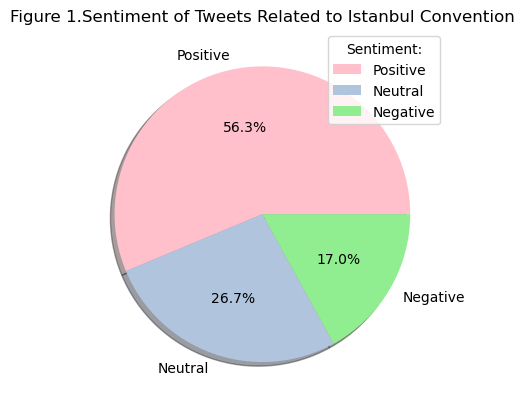

Sentiment
positive    1687
neutral      801
negative     509
Name: count, dtype: int64

In [11]:
my_colors = ['pink','lightsteelblue','lightgreen']
my_labels = ['Positive','Neutral','Negative']

plt.pie(annotated_istsöz_tweets['Sentiment'].value_counts(),labels= my_labels,autopct='%1.1f%%', colors=my_colors, shadow=True)
plt.title("Figure 1.Sentiment of Tweets Related to Istanbul Convention")
plt.legend(title = "Sentiment:")
plt.show()
annotated_istsöz_tweets['Sentiment'].value_counts()

In [12]:
plt.savefig("Figure 1.Sentiment of Tweets Related to Istanbul Convention.png")

<Figure size 640x480 with 0 Axes>

## Preprocessing

In [10]:
import re

In [11]:
annotated_istsöz_tweets['Tweet'] = [token.lower() for token in annotated_istsöz_tweets['Tweet']]
annotated_istsöz_tweets.head(10)

,Unnamed: 0,Date,Tweet,Id,Sentiment
0,36621,2022-02-19 08:50:11+00:00,@mehmetamca06 kadın cinayetlerinin başına yaza...,1.494957e+18,negative
1,9760,2021-03-20 21:02:07+00:00,#istanbulsözleşmesi\ni̇lginç olan \nyürürlüğe ...,1.373379e+18,neutral
2,2900,2021-06-16 20:53:23+00:00,kadir şeker utanmadan cezalandırıyorken!böyle...,1.405267e+18,positive
3,22092,2021-03-20 10:05:56+00:00,#i̇stanbulsözleşmesi https://t.co/nk7bqrynmv,1.373214e+18,neutral
4,50127,2021-03-20 09:26:24+00:00,@sassyluvz @cemrekisa @mirnawie @bpthaber kadı...,1.373204e+18,negative
5,5575,2021-03-24 21:57:52+00:00,ne suçu vardı o çocuğun ? ne suçu var bu kadın...,1.374843e+18,neutral
6,26695,2021-03-20 08:44:28+00:00,türkiye i̇stanbul sözleşmesinden ayrıldı. bakı...,1.373194e+18,positive
7,43171,2021-04-01 20:52:15+00:00,@wonderwonss @rtna68 @solcugazete iftira mı mo...,1.377726e+18,positive
8,20325,2021-03-20 10:40:13+00:00,gün geçtikçe kadın haklarının çoğalması gereki...,1.373223e+18,positive
9,27469,2021-03-20 08:28:44+00:00,#i̇stanbulsözleşmesi #istanbulsozlesmesiyasati...,1.373190e+18,positive


In [12]:
found = annotated_istsöz_tweets[annotated_istsöz_tweets['Tweet'].str.contains('\n')]
found.count()

Unnamed: 0    1244
Date          1244
Tweet         1244
Id            1244
Sentiment     1243
dtype: int64

In [13]:
annotated_istsöz_tweets['Tweet'] = annotated_istsöz_tweets['Tweet'].replace('\n', '', regex=True)
found = annotated_istsöz_tweets[annotated_istsöz_tweets['Tweet'].str.contains('\n')]
found.count()

Unnamed: 0    0
Date          0
Tweet         0
Id            0
Sentiment     0
dtype: int64

In [14]:
found = annotated_istsöz_tweets[annotated_istsöz_tweets['Tweet'].str.contains('@')]
found.count()

Unnamed: 0    840
Date          840
Tweet         840
Id            840
Sentiment     840
dtype: int64

In [15]:
annotated_istsöz_tweets['Tweet'] = annotated_istsöz_tweets['Tweet'].replace('@[A-Za-z0-9_]+', '', regex=True).replace('@[A-Za-z0-9_]', '', regex=True)
found = annotated_istsöz_tweets[annotated_istsöz_tweets['Tweet'].str.contains('@')]
found.count()

Unnamed: 0    1
Date          1
Tweet         1
Id            1
Sentiment     1
dtype: int64

In [16]:
annotated_istsöz_tweets[annotated_istsöz_tweets['Tweet'].str.contains('@')]

,Unnamed: 0,Date,Tweet,Id,Sentiment
2286,33002,2021-03-20 05:55:55+00:00,sonunda allah c.c şükürler olsun ki #ucube #ya...,1.373151e+18,negative


In [17]:
annotated_istsöz_tweets['Tweet'] = annotated_istsöz_tweets['Tweet'].replace('@', '', regex=True)
found = annotated_istsöz_tweets[annotated_istsöz_tweets['Tweet'].str.contains('@')]
found.count()

Unnamed: 0    0
Date          0
Tweet         0
Id            0
Sentiment     0
dtype: int64

In [18]:
annotated_istsöz_tweets['Tweet'] = annotated_istsöz_tweets['Tweet'].replace(r'http\S+', '', regex=True).replace(r'www\S+', '', regex=True)
found = annotated_istsöz_tweets[annotated_istsöz_tweets['Tweet'].str.contains('http')]
found.count()

Unnamed: 0    0
Date          0
Tweet         0
Id            0
Sentiment     0
dtype: int64

### Removing Punctuations, Emojis and Numbers

In [19]:
import string

In [20]:
sentences = annotated_istsöz_tweets['Tweet'].copy()
new_sent = []
i = 0
for sentence in sentences:
    new_sentence = re.sub('[0-9]+', '', sentence)
    new_sent.append(new_sentence)
    i += 1
    
annotated_istsöz_tweets['Tweet'] = new_sent
annotated_istsöz_tweets

,Unnamed: 0,Date,Tweet,Id,Sentiment
0,36621,2022-02-19 08:50:11+00:00,kadın cinayetlerinin başına yazabileceğimiz s...,1.494957e+18,negative
1,9760,2021-03-20 21:02:07+00:00,#istanbulsözleşmesii̇lginç olan yürürlüğe gird...,1.373379e+18,neutral
2,2900,2021-06-16 20:53:23+00:00,kadir şeker utanmadan cezalandırıyorken!böyle...,1.405267e+18,positive
3,22092,2021-03-20 10:05:56+00:00,#i̇stanbulsözleşmesi,1.373214e+18,neutral
4,50127,2021-03-20 09:26:24+00:00,"kadın öldürmek, daha doğrusu insan öldürme...",1.373204e+18,negative
...,...,...,...,...,...
2995,8382,2021-03-21 11:19:30+00:00,#istanbulşözleşmesi iptali üzerine gelen gel...,1.373595e+18,negative
2996,43599,2021-03-29 09:37:20+00:00,"fenerbahçe ve galatasaray spor kulüpleri ""ista...",1.376469e+18,neutral
2997,27445,2021-03-20 08:29:10+00:00,#istanbulsözleşmesi iptal olması mükemmel mağ...,1.373190e+18,positive
2998,50199,2021-03-20 09:14:58+00:00,"gezi, hedepe, istanbul sözleşmesi, andımız? he...",1.373201e+18,neutral


In [21]:
table = str.maketrans('', '', string.punctuation)
sentences = annotated_istsöz_tweets['Tweet'].copy()
new_sent = []
for sentence in sentences:
    words = sentence.split()
    stripped = [w.translate(table) for w in words]
    new_sent.append(stripped)

In [22]:
annotated_istsöz_tweets['Tweet'] = new_sent
annotated_istsöz_tweets

,Unnamed: 0,Date,Tweet,Id,Sentiment
0,36621,2022-02-19 08:50:11+00:00,"[kadın, cinayetlerinin, başına, yazabileceğimi...",1.494957e+18,negative
1,9760,2021-03-20 21:02:07+00:00,"[istanbulsözleşmesii̇lginç, olan, yürürlüğe, g...",1.373379e+18,neutral
2,2900,2021-06-16 20:53:23+00:00,"[kadir, şeker, utanmadan, cezalandırıyorkenböy...",1.405267e+18,positive
3,22092,2021-03-20 10:05:56+00:00,[i̇stanbulsözleşmesi],1.373214e+18,neutral
4,50127,2021-03-20 09:26:24+00:00,"[kadın, öldürmek, daha, doğrusu, insan, öldürm...",1.373204e+18,negative
...,...,...,...,...,...
2995,8382,2021-03-21 11:19:30+00:00,"[istanbulşözleşmesi, iptali, üzerine, gelen, g...",1.373595e+18,negative
2996,43599,2021-03-29 09:37:20+00:00,"[fenerbahçe, ve, galatasaray, spor, kulüpleri,...",1.376469e+18,neutral
2997,27445,2021-03-20 08:29:10+00:00,"[istanbulsözleşmesi, iptal, olması, mükemmel, ...",1.373190e+18,positive
2998,50199,2021-03-20 09:14:58+00:00,"[gezi, hedepe, istanbul, sözleşmesi, andımız, ...",1.373201e+18,neutral


### Tokenization

In [23]:
!pip install antlr4-python3-runtime==4.8

In [25]:
import time
import logging
import sys

from zemberek import (
    TurkishSpellChecker,
    TurkishSentenceNormalizer,
    TurkishSentenceExtractor,
    TurkishMorphology,
    TurkishTokenizer
)

logger = logging.getLogger(__name__)

morphology = TurkishMorphology.create_with_defaults()
normalizer = TurkishSentenceNormalizer(morphology)
extractor = TurkishSentenceExtractor()

2022-08-28 20:51:14,529 - zemberek.morphology.turkish_morphology - INFO
Msg: TurkishMorphology instance initialized in 6.498729944229126



### Normalization

In [26]:
def normalize_long_text(text):
    normalized_sentences = [normalizer.normalize(word) for word in text]
    normalized_text = " ".join(normalized_sentences)
    return normalized_text

In [27]:
sentences = annotated_istsöz_tweets['Tweet'].copy()
new_sent = []
start = time.time()

for token in sentences:   
    if token.count('') > 0:
        token = list(filter(('').__ne__, token))
    new_token = normalize_long_text(token)
    new_sent.append(new_token)

logger.info(f"Sentences normalized in: {time.time() - start} s")

2022-08-28 20:56:02,161 - __main__ - INFO
Msg: Sentences normalized in: 204.15416193008423 s



### Stopwords

In [28]:
from nltk.corpus import stopwords


stops = set(stopwords.words('turkish'))
print(stops)

{'bazı', 'bu', 'ile', 'mü', 'tüm', 'ya', 'diye', 'hepsi', 'da', 'eğer', 'şu', 'az', 've', 'için', 'neden', 'sanki', 'ama', 'defa', 'veya', 'ki', 'en', 'ne', 'mı', 'çok', 'hiç', 'de', 'o', 'nereye', 'birkaç', 'mu', 'kez', 'nerde', 'nerede', 'gibi', 'biz', 'her', 'ise', 'hem', 'niçin', 'çünkü', 'kim', 'şey', 'birşey', 'siz', 'belki', 'biri', 'daha', 'nasıl', 'niye', 'acaba', 'aslında', 'hep', 'yani'}


In [29]:
splitted_words = []
for sent in new_sent:
    words = sent.split()
    splitted_words.append(words)

In [30]:
clean_sent = []
for sentence in splitted_words:
    new_sentence = [w for w in sentence if w not in stops]
    clean_sent.append(new_sentence)

### Lemmatization

In [33]:
pip install zeyrek

     |████████████████████████████████| 930 kB 1.1 MB/s eta 0:00:01
Note: you may need to restart the kernel to use updated packages.


In [35]:
import nltk
nltk.download('punkt')

[nltk_data] Downloading package punkt to
[nltk_data]     /Users/berrakarayel/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


True

In [31]:
for token in clean_sent:
    j = 0
    for word in token:
        new_word = word.replace('"', '').replace("’", '').replace("'", '').replace("”", '')
        token[j] = new_word
        j += 1

In [36]:
import zeyrek


analyzer = zeyrek.MorphAnalyzer()
lem_sent = []
for sent in clean_sent:
    normalized_sent = []
    for word in sent:
        if word == '':
            continue
        else:
            lem_word = analyzer.lemmatize(word)
            normalized_sent.append(lem_word[0][1][0])
    lem_sent.append(normalized_sent)

2022-08-28 20:59:09,509 - root - WARNING
Msg: APPENDING RESULT: <(kadın_Adj)(-)(kadın:adjectiveRoot_ST)>

2022-08-28 20:59:09,510 - root - WARNING
Msg: APPENDING RESULT: <(kadı_Noun)(-)(kadı:noun_S + a3sg_S + n:p2sg_S + nom_ST)>

2022-08-28 20:59:09,510 - root - WARNING
Msg: APPENDING RESULT: <(kadın_Noun)(-)(kadın:noun_S + a3sg_S + pnon_S + nom_ST)>

2022-08-28 20:59:09,513 - root - WARNING
Msg: APPENDING RESULT: <(cinayet_Noun)(-)(cinayet:noun_S + a3sg_S + leri:p3pl_S + nin:gen_ST)>

2022-08-28 20:59:09,514 - root - WARNING
Msg: APPENDING RESULT: <(cinayet_Noun)(-)(cinayet:noun_S + ler:a3pl_S + in:p2sg_S + in:gen_ST)>

2022-08-28 20:59:09,514 - root - WARNING
Msg: APPENDING RESULT: <(cinayet_Noun)(-)(cinayet:noun_S + ler:a3pl_S + i:p3sg_S + nin:gen_ST)>

2022-08-28 20:59:09,514 - root - WARNING
Msg: APPENDING RESULT: <(cinayet_Noun)(-)(cinayet:noun_S + ler:a3pl_S + i:p3pl_S + nin:gen_ST)>

2022-08-28 20:59:09,517 - root - WARNING
Msg: APPENDING RESULT: <(baş_Noun)(-)(baş:noun_S + a3s

In [37]:
x = lem_sent.copy()
for sent in x:
    i = 0
    for token in sent:
        sent[i] = token.lower()
        i += 1
lem_sent = x

In [38]:
lem_sent = list(filter(('').__ne__, lem_sent))

In [39]:
annotated_istsöz_tweets['Tweet'] = lem_sent
annotated_istsöz_tweets['Tweet'].head(5)

0    [kadın, cinayet, baş, yazmak, sebep, süre, naf...
1    [istanbulsözleşmesii̇lginç, olmak, yürümek, gi...
2    [kadir, şeker, utanmak, cezalandırıyorkenböyle...
3                                [i̇stanbulsözleşmesi]
4    [kadın, ölmek, doğrusu, insan, ölmek, zaten, y...
Name: Tweet, dtype: object

In [46]:
annotated_istsöz_tweets['Tweet'] = annotated_istsöz_tweets.Tweet.apply(' '.join)

In [48]:
annotated_istsöz_tweets.to_csv('istsöz_tweets_preprocessed.csv')

### Loading Data Sets

In [38]:
import pandas as pd
import numpy as np

from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.feature_extraction.text import CountVectorizer

In [49]:
preprocessed_istsöz = pd.read_csv("istsöz_tweets_preprocessed.csv")

In [50]:
preprocessed_istsöz.head(10)

,Unnamed: 0.1,Unnamed: 0,Date,Tweet,Id,Sentiment
0,0,36621,2022-02-19 08:50:11+00:00,kadın cinayet baş yazmak sebep süre nafakakadı...,1.494957e+18,negative
1,1,9760,2021-03-20 21:02:07+00:00,istanbulsözleşmesii̇lginç olmak yürümek girmek...,1.373379e+18,neutral
2,2,2900,2021-06-16 20:53:23+00:00,kadir şeker utanmak cezalandırıyorkenböyle hay...,1.405267e+18,positive
3,3,22092,2021-03-20 10:05:56+00:00,i̇stanbulsözleşmesi,1.373214e+18,neutral
4,4,50127,2021-03-20 09:26:24+00:00,kadın ölmek doğrusu insan ölmek zaten yasak e ...,1.373204e+18,negative
5,5,5575,2021-03-24 21:57:52+00:00,suç var çocuk suç var kadın gün bir kadın çocu...,1.374843e+18,neutral
6,6,26695,2021-03-20 08:44:28+00:00,türki i̇stanbul sözleşme ayrılmak bakı tarih n...,1.373194e+18,positive
7,7,43171,2021-04-01 20:52:15+00:00,iftira mi mor halka kısa birörnek chp taciz te...,1.377726e+18,positive
8,8,20325,2021-03-20 10:40:13+00:00,gün geçmek kadın hak çoğalmak gerekmek kötü gi...,1.373223e+18,positive
9,9,27469,2021-03-20 08:28:44+00:00,i̇stanbulsözleşmesi istanbulsözleşmesiyasatır,1.373190e+18,positive


In [51]:
preprocessed_istsöz.shape

(3000, 6)

In [52]:
preprocessed_istsöz.drop(["Unnamed: 0", "Unnamed: 0.1"], axis=1, inplace=True)

In [53]:
preprocessed_istsöz.columns

Index(['Date', 'Tweet', 'Id', 'Sentiment'], dtype='object')

In [54]:
preprocessed_istsöz.isna().any()

Date         False
Tweet         True
Id           False
Sentiment     True
dtype: bool

In [56]:
preprocessed_istsöz = preprocessed_istsöz.dropna()

In [57]:
preprocessed_istsöz.isna().any()

Date         False
Tweet        False
Id           False
Sentiment    False
dtype: bool

In [58]:
preprocessed_istsöz["Sentiment"].value_counts()

Sentiment
positive    1685
neutral      800
negative     509
Name: count, dtype: int64

In [59]:
X = preprocessed_istsöz["Tweet"]
y = preprocessed_istsöz["Sentiment"]

In [60]:
X

0       kadın cinayet baş yazmak sebep süre nafakakadı...
1       istanbulsözleşmesii̇lginç olmak yürümek girmek...
2       kadir şeker utanmak cezalandırıyorkenböyle hay...
3                                     i̇stanbulsözleşmesi
4       kadın ölmek doğrusu insan ölmek zaten yasak e ...
                              ...                        
2995    istanbulşözleşmesi iptal üzeri ge geliyor ülke...
2996    fenerbahçe galatasaray spor kulüp i̇stanbul sö...
2997    istanbulsözleşmesi iptal olmak mükemmel mağdur...
2998    gez hdp i̇stanbul sözleşme ant kes gerekmek ge...
2999    siz fonlamak güruh i̇stanbul sözleşme ni türk ...
Name: Tweet, Length: 2994, dtype: object

In [61]:
y

0       negative
1        neutral
2       positive
3        neutral
4       negative
          ...   
2995    negative
2996     neutral
2997    positive
2998     neutral
2999    negative
Name: Sentiment, Length: 2994, dtype: object

## Feature Extraction

2 methods were used for this part which are Bag of Words (BOW) and Term Frequency-Inverse Document Frequency (TF-IDF). 

### Part 1: CountVectorizer for text classification

In this part, first I focusd on Bag of Words and then test the algorithms.

In [62]:
Xtrain, Xtest, ytrain, ytest = train_test_split(X, y,test_size=0.2,random_state=1)

In [63]:
count_vectorizer=CountVectorizer()

In [64]:
pip install scikit-learn numpy

python(95400) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


DEPRECATION: pyodbc 4.0.0-unsupported has a non-standard version number. pip 24.0 will enforce this behaviour change. A possible replacement is to upgrade to a newer version of pyodbc or contact the author to suggest that they release a version with a conforming version number. Discussion can be found at https://github.com/pypa/pip/issues/12063
Note: you may need to restart the kernel to use updated packages.


In [65]:
X, y = preprocessed_istsöz.Tweet.fillna(' '), preprocessed_istsöz.Sentiment

In [66]:
X_train=count_vectorizer.fit_transform(Xtrain)

In [67]:
X_test=count_vectorizer.transform(Xtest)

In [68]:
print(count_vectorizer.get_feature_names()[:10])

['aa', 'aah', 'ab', 'abartmak', 'abd', 'abdest', 'abdullah', 'abdyenatoya', 'aber', 'aberracıón']


In [69]:
count_df = pd.DataFrame(X_train.A, columns=count_vectorizer.get_feature_names())

In [70]:
print(count_df.head())

   aa  aah  ab  abartmak  abd  abdest  abdullah  abdyenatoya  aber  \
0   0    0   0         0    0       0         0            0     0   
1   0    0   0         0    0       0         0            0     0   
2   0    0   0         0    0       0         0            0     0   
3   0    0   0         0    0       0         0            0     0   
4   0    0   0         0    0       0         0            0     0   

   aberracıón  ...  ولا  يصل  يقتل  कब  มม  เนเน  より  トルコ  \
0           0  ...    0    0     0   0   0     0   0    0   
1           0  ...    0    0     0   0   0     0   0    0   
2           0  ...    0    0     0   0   0     0   0    0   
3           0  ...    0    0     0   0   0     0   0    0   
4           0  ...    0    0     0   0   0     0   0    0   

   トルコはイスタンブール条約から正式に脱退  끝나지않을비투비년  
0                     0          0  
1                     0          0  
2                     0          0  
3                     0          0  
4                     0    

## Finding the Best Fit Model - Using BOW as feature extraction technique

5 supervised machine learning models were tested for the prediction.

1. Support Vector Machine
2. Logistic Regression
3. Random Forest
4. K Nearest Neighbor (KNN)
5. Multinominal Naive Bayes

### Support Vector Machine (BOW)

In [71]:
from sklearn.svm import SVC

In [73]:
svm=SVC()
svm.fit(X_train, ytrain)
ypred2=svm.predict(X_test)
accuracy_score(ytest,ypred2)
print(classification_report(ytest,ypred2))

              precision    recall  f1-score   support

    negative       0.77      0.18      0.30        92
     neutral       0.66      0.30      0.41       167
    positive       0.63      0.93      0.75       340

    accuracy                           0.64       599
   macro avg       0.69      0.47      0.49       599
weighted avg       0.66      0.64      0.59       599



In [84]:
#Optimization of metrics using GridSearchCV

from sklearn.model_selection import GridSearchCV
from sklearn.metrics import f1_score, make_scorer
svc_parameters=dict(C= [0.1, 1, 10, 100, 1000],
              gamma= [1, 0.1, 0.01, 0.001, 0.0001],
              kernel= ['rbf'])
gridmodelsvc = GridSearchCV(svm, svc_parameters, cv = 3,n_jobs=-1, scoring="f1_micro")
gridmodelsvc.fit(X_train, ytrain)
svcmodel=gridmodelsvc.predict(X_test)


print(gridmodelsvc.best_params_)
print('After optimization: '+ str(accuracy_score(ytest, svcmodel)))
print(classification_report(ytest,svcmodel))

python(10500) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(10501) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(10502) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(10503) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(10504) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(10505) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(10506) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(10507) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


{'C': 10, 'gamma': 0.1, 'kernel': 'rbf'}
After optimization: 0.669449081803005
              precision    recall  f1-score   support

    negative       0.56      0.25      0.35        92
     neutral       0.62      0.54      0.58       167
    positive       0.70      0.85      0.76       340

    accuracy                           0.67       599
   macro avg       0.63      0.55      0.56       599
weighted avg       0.66      0.67      0.65       599



### Logistic Regression (BOW)

In [74]:
from sklearn.linear_model import LogisticRegression
from sklearn import linear_model

In [75]:
log_reg = linear_model.LogisticRegression()
log_reg.fit(X_train,ytrain)
y_pred=log_reg.predict(X_test)
print(classification_report(ytest,y_pred))

              precision    recall  f1-score   support

    negative       0.58      0.41      0.48        92
     neutral       0.63      0.61      0.62       167
    positive       0.77      0.84      0.80       340

    accuracy                           0.71       599
   macro avg       0.66      0.62      0.64       599
weighted avg       0.70      0.71      0.70       599



### Random Forest (BOW)

In [76]:
from sklearn.ensemble import RandomForestClassifier

In [77]:
random_forest=RandomForestClassifier()
random_forest.fit(X_train,ytrain)
ypred1=random_forest.predict(X_test)
print(classification_report(ytest,ypred1))

              precision    recall  f1-score   support

    negative       0.58      0.21      0.30        92
     neutral       0.58      0.62      0.60       167
    positive       0.72      0.82      0.77       340

    accuracy                           0.67       599
   macro avg       0.62      0.55      0.56       599
weighted avg       0.66      0.67      0.65       599



In [85]:
#Optimization of metrics using GridSearchCV

from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score
parameters = dict(n_estimators = [100,300,500,800,1200], max_depth = [5, 8, 15, 25, 30],  
              min_samples_split = [2, 5, 10, 15, 100], 
             min_samples_leaf = [1, 2, 5, 10])
gridmodelrf = GridSearchCV(random_forest, parameters, cv = 3,n_jobs=-1,scoring="f1_micro")
gridmodelrf.fit(X_train, ytrain)
grmodel=gridmodelrf.predict(X_test)
print('After optimization: '+ str(accuracy_score(ytest, grmodel)))
print(classification_report(ytest,grmodel))
print(gridmodelrf.best_params_)
print(gridmodelrf.best_score_)

After optimization: 0.5809682804674458
              precision    recall  f1-score   support

    negative       1.00      0.01      0.02        92
     neutral       0.75      0.05      0.10       167
    positive       0.58      0.99      0.73       340

    accuracy                           0.58       599
   macro avg       0.78      0.35      0.28       599
weighted avg       0.69      0.58      0.45       599

{'max_depth': 30, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 100}
0.6008272663301977


### K Nearest Neighbor (KNN) (BOW)

In [78]:
from sklearn.neighbors import KNeighborsClassifier

In [79]:
# Initialize the KNN classifier
k_nearest = KNeighborsClassifier()

# Train the classifier
k_nearest.fit(X_train, ytrain)

# Predict on the test set
ypred3=k_nearest.predict(X_test)

# Calculate accuracy
accuracy_score(ytest,ypred3)
print(classification_report(ytest,ypred3))

              precision    recall  f1-score   support

    negative       0.23      0.05      0.09        92
     neutral       0.36      0.89      0.52       167
    positive       0.81      0.40      0.53       340

    accuracy                           0.48       599
   macro avg       0.47      0.45      0.38       599
weighted avg       0.60      0.48      0.46       599



/Users/berrakarayel/opt/anaconda3/lib/python3.8/site-packages/sklearn/neighbors/_classification.py:211: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)


In [87]:
#Optimization of metrics using GridSearchCV

# Define the parameters grid
kn_parameters=dict(n_neighbors=[3,5,11,19,26,30,40,45,60,100],weights=['uniform','distance'],
                   metric=['euclidean','manhattan','cosine'])

# Initialize GridSearchCV
gridmodelkn = GridSearchCV(k_nearest, kn_parameters, cv = 3,n_jobs=-1,scoring="f1_micro")

# Fit the model
gridmodelkn.fit(X_train, ytrain)

# Predict on the test set using the optimized model
knmodel=gridmodelkn.predict(X_test)

# Print the best parameters found by GridSearchCV
print(gridmodelkn.best_params_)

# Evaluate the performance of the optimized model
print('After optimization: ' + str(accuracy_score(ytest, knmodel)))
print(classification_report(ytest,knmodel))

{'metric': 'cosine', 'n_neighbors': 100, 'weights': 'distance'}
After optimization: 0.5559265442404007
              precision    recall  f1-score   support

    negative       0.40      0.04      0.08        92
     neutral       0.43      0.44      0.44       167
    positive       0.61      0.75      0.67       340

    accuracy                           0.56       599
   macro avg       0.48      0.41      0.40       599
weighted avg       0.53      0.56      0.52       599



/Users/berrakarayel/opt/anaconda3/lib/python3.8/site-packages/sklearn/neighbors/_classification.py:211: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)
/Users/berrakarayel/opt/anaconda3/lib/python3.8/site-packages/sklearn/neighbors/_classification.py:211: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None wi

/Users/berrakarayel/opt/anaconda3/lib/python3.8/site-packages/sklearn/neighbors/_classification.py:211: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)
/Users/berrakarayel/opt/anaconda3/lib/python3.8/site-packages/sklearn/neighbors/_classification.py:211: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None wi

/Users/berrakarayel/opt/anaconda3/lib/python3.8/site-packages/sklearn/neighbors/_classification.py:211: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)
/Users/berrakarayel/opt/anaconda3/lib/python3.8/site-packages/sklearn/neighbors/_classification.py:211: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None wi

/Users/berrakarayel/opt/anaconda3/lib/python3.8/site-packages/sklearn/neighbors/_classification.py:211: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)
/Users/berrakarayel/opt/anaconda3/lib/python3.8/site-packages/sklearn/neighbors/_classification.py:211: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None wi

### Multinominal NB (BOW)

In [80]:
from sklearn.naive_bayes import MultinomialNB

In [81]:
multi_nb=MultinomialNB()
multi_nb.fit(X_train,ytrain)
y_pred=multi_nb.predict(X_test)
print(classification_report(ytest,y_pred))

              precision    recall  f1-score   support

    negative       0.47      0.29      0.36        92
     neutral       0.71      0.41      0.52       167
    positive       0.69      0.91      0.79       340

    accuracy                           0.67       599
   macro avg       0.62      0.54      0.55       599
weighted avg       0.66      0.67      0.65       599



###  Part 2: TfidfVectorizer for text classification

In the second part, tf-idf was used as a feature extraction technique. 

In [89]:
Xtrain, Xtest, ytrain, ytest = train_test_split(X, y,test_size=0.2,random_state=1)

In [90]:
# Import TfidfVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer

In [91]:
# Initialize a TfidfVectorizer object: tfidf_vectorizer
tfidf_vectorizer = TfidfVectorizer()

In [92]:
X, y = preprocessed_istsöz.Tweet.fillna(' '), preprocessed_istsöz.Sentiment

In [93]:
# Transform the training data: tfidf_train
X_train=tfidf_vectorizer.fit_transform(Xtrain)

In [94]:
# Transform the test data: tfidf_test
X_test=tfidf_vectorizer.transform(Xtest)

In [95]:
# Print the first 10 features
print(tfidf_vectorizer.get_feature_names()[:10])

['aa', 'aah', 'ab', 'abartmak', 'abd', 'abdest', 'abdullah', 'abdyenatoya', 'aber', 'aberracıón']


In [96]:
# Create the TfidfVectorizer DataFrame: tfidf_df
tfidf_df = pd.DataFrame(X_train.A, columns=tfidf_vectorizer.get_feature_names())

In [97]:
# Print the head of tfidf_df
print(tfidf_df.head())

    aa  aah   ab  abartmak  abd  abdest  abdullah  abdyenatoya  aber  \
0  0.0  0.0  0.0       0.0  0.0     0.0       0.0          0.0   0.0   
1  0.0  0.0  0.0       0.0  0.0     0.0       0.0          0.0   0.0   
2  0.0  0.0  0.0       0.0  0.0     0.0       0.0          0.0   0.0   
3  0.0  0.0  0.0       0.0  0.0     0.0       0.0          0.0   0.0   
4  0.0  0.0  0.0       0.0  0.0     0.0       0.0          0.0   0.0   

   aberracıón  ...  ولا  يصل  يقتل   कब   มม  เนเน   より  トルコ  \
0         0.0  ...  0.0  0.0   0.0  0.0  0.0   0.0  0.0  0.0   
1         0.0  ...  0.0  0.0   0.0  0.0  0.0   0.0  0.0  0.0   
2         0.0  ...  0.0  0.0   0.0  0.0  0.0   0.0  0.0  0.0   
3         0.0  ...  0.0  0.0   0.0  0.0  0.0   0.0  0.0  0.0   
4         0.0  ...  0.0  0.0   0.0  0.0  0.0   0.0  0.0  0.0   

   トルコはイスタンブール条約から正式に脱退  끝나지않을비투비년  
0                   0.0        0.0  
1                   0.0        0.0  
2                   0.0        0.0  
3                   0.0        0.0

## Finding the Best Fit Model - Using TF-IDF as feature extraction technique

5 supervised machine learning models were tested for the prediction.

1. Support Vector Machine
2. Logistic Regression
3. Random Forest
4. K Nearest Neighbor (KNN)
5. Multinominal Naive Bayes

### Support Vector Machine (Tf-idf)

In [98]:
from sklearn.svm import SVC

In [99]:
svm=SVC()
svm.fit(X_train, ytrain)
ypred2=svm.predict(X_test)
accuracy_score(ytest,ypred2)
print(classification_report(ytest,ypred2))

              precision    recall  f1-score   support

    negative       0.61      0.15      0.24        92
     neutral       0.78      0.38      0.51       167
    positive       0.65      0.95      0.77       340

    accuracy                           0.67       599
   macro avg       0.68      0.49      0.51       599
weighted avg       0.68      0.67      0.62       599



In [100]:
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import f1_score, make_scorer
svc_parameters=dict(C= [0.1, 1, 10, 100, 1000],
              gamma= [1, 0.1, 0.01, 0.001, 0.0001],
              kernel= ['rbf'])
gridmodelsvc = GridSearchCV(svm, svc_parameters, cv = 3,n_jobs=-1, scoring="f1_micro")
gridmodelsvc.fit(X_train, ytrain)
svcmodel=gridmodelsvc.predict(X_test)


print(gridmodelsvc.best_params_)
print('After optimization: '+ str(accuracy_score(ytest, svcmodel)))
print(classification_report(ytest,svcmodel))

python(12703) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(12704) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(12705) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(12706) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(12707) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(12708) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(12709) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(12710) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


{'C': 10, 'gamma': 0.1, 'kernel': 'rbf'}
After optimization: 0.7145242070116862
              precision    recall  f1-score   support

    negative       0.53      0.42      0.47        92
     neutral       0.69      0.57      0.63       167
    positive       0.76      0.86      0.81       340

    accuracy                           0.71       599
   macro avg       0.66      0.62      0.64       599
weighted avg       0.70      0.71      0.71       599



### Logistic Regression (Tf-idf)

In [101]:
from sklearn.linear_model import LogisticRegression
from sklearn import linear_model

In [102]:
log_reg = linear_model.LogisticRegression()
log_reg.fit(X_train,ytrain)
y_pred=log_reg.predict(X_test)
print(classification_report(ytest,y_pred))

              precision    recall  f1-score   support

    negative       0.56      0.24      0.34        92
     neutral       0.72      0.47      0.57       167
    positive       0.69      0.91      0.79       340

    accuracy                           0.69       599
   macro avg       0.66      0.54      0.56       599
weighted avg       0.68      0.69      0.66       599



### Random Forest (Tf-idf)

In [104]:
from sklearn.ensemble import RandomForestClassifier

In [105]:
random_forest=RandomForestClassifier()
random_forest.fit(X_train,ytrain)
ypred1=random_forest.predict(X_test)
print(classification_report(ytest,ypred1))

              precision    recall  f1-score   support

    negative       0.47      0.16      0.24        92
     neutral       0.74      0.38      0.50       167
    positive       0.66      0.94      0.77       340

    accuracy                           0.66       599
   macro avg       0.62      0.49      0.51       599
weighted avg       0.65      0.66      0.62       599



In [106]:
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score
parameters = dict(n_estimators = [100,300,500,800,1200], max_depth = [5, 8, 15, 25, 30],  
              min_samples_split = [2, 5, 10, 15, 100], 
             min_samples_leaf = [1, 2, 5, 10])
gridmodelrf = GridSearchCV(random_forest, parameters, cv = 3,n_jobs=-1,scoring="f1_micro")
gridmodelrf.fit(X_train, ytrain)
grmodel=gridmodelrf.predict(X_test)
print('After optimization: '+ str(accuracy_score(ytest, grmodel)))
print(classification_report(ytest,grmodel))
print(gridmodelrf.best_params_)
print(gridmodelrf.best_score_)

After optimization: 0.6410684474123539
              precision    recall  f1-score   support

    negative       0.75      0.03      0.06        92
     neutral       0.80      0.31      0.45       167
    positive       0.62      0.97      0.76       340

    accuracy                           0.64       599
   macro avg       0.72      0.44      0.42       599
weighted avg       0.69      0.64      0.56       599

{'max_depth': 30, 'min_samples_leaf': 2, 'min_samples_split': 5, 'n_estimators': 300}
0.6434233267775196


### K Nearest Neighbor (KNN) (Tf-idf)

In [107]:
from sklearn.neighbors import KNeighborsClassifier

In [108]:
k_nearest = KNeighborsClassifier()
k_nearest.fit(X_train, ytrain)
ypred3=k_nearest.predict(X_test)
accuracy_score(ytest,ypred3)
print(classification_report(ytest,ypred3))

              precision    recall  f1-score   support

    negative       0.38      0.37      0.37        92
     neutral       0.55      0.61      0.58       167
    positive       0.80      0.76      0.78       340

    accuracy                           0.66       599
   macro avg       0.58      0.58      0.58       599
weighted avg       0.67      0.66      0.66       599



/Users/berrakarayel/opt/anaconda3/lib/python3.8/site-packages/sklearn/neighbors/_classification.py:211: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)


In [109]:
kn_parameters=dict(n_neighbors=[3,5,11,19,26,30,40,45,60,100],weights=['uniform','distance'],
                   metric=['euclidean','manhattan','cosine'])
gridmodelkn = GridSearchCV(k_nearest, kn_parameters, cv = 3,n_jobs=-1,scoring="f1_micro")
gridmodelkn.fit(X_train, ytrain)

knmodel=gridmodelkn.predict(X_test)
print(gridmodelkn.best_params_)
print('After optimization: ' + str(accuracy_score(ytest, knmodel)))
print(classification_report(ytest,knmodel))

{'metric': 'euclidean', 'n_neighbors': 5, 'weights': 'distance'}
After optimization: 0.659432387312187
              precision    recall  f1-score   support

    negative       0.40      0.33      0.36        92
     neutral       0.55      0.58      0.56       167
    positive       0.77      0.79      0.78       340

    accuracy                           0.66       599
   macro avg       0.57      0.57      0.57       599
weighted avg       0.65      0.66      0.66       599



### Multinominal NB (Tf-idf)

In [110]:
from sklearn.naive_bayes import MultinomialNB

In [111]:
multi_nb=MultinomialNB()
multi_nb.fit(X_train,ytrain)
y_pred=multi_nb.predict(X_test)
print(classification_report(ytest,y_pred))

              precision    recall  f1-score   support

    negative       0.00      0.00      0.00        92
     neutral       0.76      0.23      0.36       167
    positive       0.61      0.98      0.75       340

    accuracy                           0.62       599
   macro avg       0.46      0.40      0.37       599
weighted avg       0.56      0.62      0.53       599



/Users/berrakarayel/opt/anaconda3/lib/python3.8/site-packages/sklearn/neighbors/_classification.py:211: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)
/Users/berrakarayel/opt/anaconda3/lib/python3.8/site-packages/sklearn/neighbors/_classification.py:211: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None wi

/Users/berrakarayel/opt/anaconda3/lib/python3.8/site-packages/sklearn/neighbors/_classification.py:211: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)
/Users/berrakarayel/opt/anaconda3/lib/python3.8/site-packages/sklearn/neighbors/_classification.py:211: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None wi

/Users/berrakarayel/opt/anaconda3/lib/python3.8/site-packages/sklearn/neighbors/_classification.py:211: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)
/Users/berrakarayel/opt/anaconda3/lib/python3.8/site-packages/sklearn/neighbors/_classification.py:211: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None wi

/Users/berrakarayel/opt/anaconda3/lib/python3.8/site-packages/sklearn/neighbors/_classification.py:211: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)
/Users/berrakarayel/opt/anaconda3/lib/python3.8/site-packages/sklearn/neighbors/_classification.py:211: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None wi

/Users/berrakarayel/opt/anaconda3/lib/python3.8/site-packages/sklearn/neighbors/_classification.py:211: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)
/Users/berrakarayel/opt/anaconda3/lib/python3.8/site-packages/sklearn/neighbors/_classification.py:211: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None wi

## Predicting Sentiment (Using Tf-idf Vectorizer and Logistic Regression Model)

In [119]:
#loading annotated set
annotated_istsöz = pd.read_csv("annotated.csv")
annotated_istsöz.head()

,Unnamed: 0.1,Unnamed: 0,Date,Tweet,Id,Sentiment
0,0,36621,2022-02-19 08:50:11+00:00,kadın cinayet baş yazmak sebep süre nafakakadı...,1.494957e+18,negative
1,1,9760,2021-03-20 21:02:07+00:00,istanbulsözleşmesii̇lginç olmak yürümek girmek...,1.373379e+18,neutral
2,2,2900,2021-06-16 20:53:23+00:00,kadir şeker utanmak cezalandırıyorkenböyle hay...,1.405267e+18,positive
3,3,22092,2021-03-20 10:05:56+00:00,i̇stanbulsözleşmesi,1.373214e+18,neutral
4,4,50127,2021-03-20 09:26:24+00:00,kadın ölmek doğrusu insan ölmek zaten yasak e ...,1.373204e+18,negative


In [112]:
# Loading all data set
all_tweets = pd.read_csv("ist_söz_cleaned.csv")

/var/folders/5q/s1r244vx3q30tczvdcr2cqzw0000gn/T/ipykernel_89767/240853510.py:2: DtypeWarning: Columns (0,1) have mixed types. Specify dtype option on import or set low_memory=False.
  all_tweets = pd.read_csv("ist_söz_cleaned.csv")


In [113]:
all_tweets.head()

,Unnamed: 0,Tweet ID,Tweet,Date,Emotions,User_Gender,User_Age_Group,User_Location,Ideology,Gender_female,Gender_male
0,0,1294293968293892096,Duygu da Şule gibi Rabia Naz gibi düşmedi; kat...,2020-08-14 15:25:03,"['ofke', 'arzu']",female,4.0,Ankara,NaN,1.0,0.0
1,1,1382321491023380480,"#KütüphaneSöyleşileri'nde bir kardeşimiz, İsta...",2021-04-14 13:15:00,[],male,4.0,Ankara,NaN,0.0,1.0
2,2,1463858615043903488,Kadın erkek eşittir.\nİstanbul Sözleşmesi yaşa...,2021-11-25 13:14:25,['ofke'],male,4.0,İstanbul,NaN,0.0,1.0
3,3,1376621758128734208,İstanbul Sözleşmesi ile ilgili hiç bir mecrada...,2021-03-29 19:46:18,"['ofke', 'onaylamama']",female,3.0,NaN,NaN,1.0,0.0
4,4,1287432020591890432,Mıddafa İsamoğlu' de İstanbul Sözleşmesini sav...,2020-07-26 16:58:07,['onaylamama'],female,2.0,İstanbul,NaN,1.0,0.0


In [120]:
all_tweets.isna().any()

Unnamed: 0        False
Tweet ID          False
Tweet             False
Date               True
Emotions           True
User_Gender        True
User_Age_Group     True
User_Location      True
Ideology           True
Gender_female      True
Gender_male        True
dtype: bool

### CountVectorizer for text classification

In [121]:
# Import the necessary modules
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import train_test_split

In [122]:
tfidf_vectorizer = TfidfVectorizer()

tfidf_train = tfidf_vectorizer.fit_transform(all_tweets['Tweet'].values)

print(tfidf_vectorizer.get_feature_names()[250:300])

['0a8mxslyfl', '0acwf4iy1s', '0aey38wdzu', '0afirfrgq7', '0ah05cdi6p', '0aihsaj8rh', '0ajdr4960d', '0ajmn3t6oc', '0ajuddfspf', '0am243kwzm', '0amh4j7kxt', '0aoe0audxk', '0aoomnc6kz', '0apsawiav3', '0apyxnvykh', '0aqwdzpsxg', '0arifzte9d', '0arjqgjvke', '0arjts58zh', '0armsaawyz', '0atd7dqix8', '0atke4lb8e', '0atlxuviyq', '0atpfilatd', '0avnmre94n', '0avsjqtija', '0awebumiul', '0axu4xvnhu', '0axyicitk0', '0b1lv4ab9p', '0b54ra01pi', '0b58urb8kk', '0b5icsfwzu', '0b7u0h2bel', '0b88enhwcs', '0b8f63eae1', '0b8yx20zzk', '0b9ef71gnc', '0b9oqhskbw', '0bbg92catr', '0bdexa8nhb', '0beu5djfhb', '0beyezgwrk', '0bfjkalcdn', '0bidddvtzk', '0bjnxmpvdw', '0blkdguste', '0blzzkqlne', '0bna6ibwua', '0bnqgryoge']


In [123]:
# Create a series to store the labels: y
y = annotated_istsöz.Sentiment

X_train = annotated_istsöz['Tweet']
y_train = annotated_istsöz['Sentiment']
X_test = all_tweets['Tweet']

# Initialize a CountVectorizer object: count_vectorizer
tfidf_vectorizer = TfidfVectorizer(stop_words='english')

# Transform the training data using only the 'text' column values: count_train 
tfidf_train = tfidf_vectorizer.fit_transform(X_train)

# Transform the test data using only the 'text' column values: count_test 
tfidf_test = tfidf_vectorizer.transform(X_test)

# Print the first 10 features of the count_vectorizer
print(tfidf_vectorizer.get_feature_names()[:10])

ValueError: np.nan is an invalid document, expected byte or unicode string.

##### Logistic Regression with scikit-learn

In [30]:
from sklearn.linear_model import LogisticRegression
from sklearn import linear_model
from sklearn import metrics

In [34]:
log_reg = LogisticRegression()

log_reg.fit(count_train, y_train)
pred = log_reg.predict(count_test)
metrics.accuracy_score(y_test, pred)

/Users/berrakarayel/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [ ]:
metrics.confusion_matrix(y_test, pred, labels=['positive', 'neutral', "negative"])

In [36]:
pred

array(['positive', 'positive', 'positive', ..., 'positive', 'positive',
       'neutral'], dtype=object)

In [37]:
df = pd.concat([X_test.reset_index(drop=True), pd.Series(pred, name="Predictions")], axis=1)
df.to_csv("Predictionsnew.csv", index=False)